In [7]:
import os
import numpy as np
from PIL import Image
import pandas as pd


In [8]:
# Define paths to satellite and mask image folders
sat_folder = 'DataSet_1/roads/sat'
gt_folder = 'DataSet_1/roads/gt'

# List to store data from all images
dataset = []

# List available files in each directory to check for naming issues
sat_files = sorted(os.listdir(sat_folder))
gt_files = sorted(os.listdir(gt_folder))

print("Satellite images found:", sat_files)
print("Mask images found:", gt_files)

# Loop through each satellite image and try to find the corresponding mask
for sat_file in sat_files:
    # Generate paths for both .tiff and .tif extensions
    sat_path = os.path.join(sat_folder, sat_file)
    gt_path_tiff = os.path.join(gt_folder, sat_file)
    gt_path_tif = os.path.join(gt_folder, sat_file.replace('.tiff', '.tif'))
    
    # Check if either .tiff or .tif version of the mask exists
    if os.path.exists(gt_path_tiff):
        gt_path = gt_path_tiff
    elif os.path.exists(gt_path_tif):
        gt_path = gt_path_tif
    else:
        print(f"Warning: Missing mask for {sat_file}. Skipping this file.")
        continue
    
    # Load images
    satellite_image = Image.open(sat_path)
    mask_image = Image.open(gt_path)
    
    # Convert images to numpy arrays
    satellite_array = np.array(satellite_image)
    mask_array = np.array(mask_image)
    
    # Ensure the satellite and mask images have matching dimensions
    if satellite_array.shape[:2] != mask_array.shape[:2]:
        print(f"Warning: Size mismatch for {sat_file}. Skipping this image pair.")
        continue
    
    # Flatten the arrays
    pixels_rgb = satellite_array.reshape(-1, 3)  # RGB features
    labels = mask_array.flatten()                # Binary labels (road or non-road)
    
    # Combine RGB values and labels
    image_data = np.column_stack((pixels_rgb, labels))
    
    # Append to dataset list
    dataset.append(image_data)

# Check if the dataset list is not empty before concatenation
if dataset:
    # Concatenate all image data into a single dataset
    dataset = np.vstack(dataset)
    
    # Convert to DataFrame for easier manipulation and inspection
    df = pd.DataFrame(dataset, columns=['R', 'G', 'B', 'Label'])

    # Save DataFrame to CSV for machine learning training
    csv_path = 'RGBLabel.csv'
    df.to_csv(csv_path, index=False)
    print(f"Dataset saved to {csv_path}")
else:
    print("Error: No valid image data found. Check if files are correctly placed in 'sat' and 'gt' folders.")


Satellite images found: ['10078675_15.tiff', '10228675_15.tiff', '10228705_15.tiff', '10228720_15.tiff', '10228735_15.tiff', '10228750_15.tiff', '10378675_15.tiff', '10378690_15.tiff', '10378705_15.tiff', '10378720_15.tiff', '10378735_15.tiff', '10378750_15.tiff', '10378765_15.tiff', '10528675_15.tiff', '10528690_15.tiff', '10528705_15.tiff', '10528720_15.tiff', '10528735_15.tiff', '10528750_15.tiff', '10528765_15.tiff']
Mask images found: ['10078675_15.tif', '10228675_15.tif', '10228705_15.tif', '10228720_15.tif', '10228735_15.tif', '10228750_15.tif', '10378675_15.tif', '10378690_15.tif', '10378705_15.tif', '10378720_15.tif', '10378735_15.tif', '10378750_15.tif', '10378765_15.tif', '10528675_15.tif', '10528690_15.tif', '10528705_15.tif', '10528720_15.tif', '10528735_15.tif', '10528750_15.tif', '10528765_15.tif']
Dataset saved to RGBLabel.csv


In [10]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import f1_score, confusion_matrix

# Cargar el dataset
df = pd.read_csv('RGBLabel.csv')

# Dividir en características (X) y etiquetas (y)
X = df[['R', 'G', 'B']]
Y = df['Label']

# Dividir en conjunto de entrenamiento y prueba
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.22, random_state=12)

# Modelo ANN
model = MLPClassifier(hidden_layer_sizes=(50,), early_stopping=True, tol=1e-4, max_iter=100, random_state=12)
model.fit(X_train, Y_train)



MLPClassifier(early_stopping=True, hidden_layer_sizes=(50,), max_iter=100,
              random_state=12)

In [12]:
# Directorios para almacenar las predicciones
output_csv_dir = 'outputs/csv'
output_png_dir = 'outputs/png'
os.makedirs(output_csv_dir, exist_ok=True)
os.makedirs(output_png_dir, exist_ok=True)

# Lista para almacenar las imágenes de prueba
predicted_images = []

# Cargar archivos de prueba (asumiendo que `sat_files` tiene las imágenes de prueba)
for i, sat_file in enumerate(sat_files):
    sat_path = os.path.join(sat_folder, sat_file)
    gt_path_tiff = os.path.join(gt_folder, sat_file)
    gt_path_tif = os.path.join(gt_folder, sat_file.replace('.tiff', '.tif'))
    
    # Cargar la imagen y su máscara, si existen
    if os.path.exists(gt_path_tiff):
        gt_path = gt_path_tiff
    elif os.path.exists(gt_path_tif):
        gt_path = gt_path_tif
    else:
        print(f"Warning: Missing mask for {sat_file}. Skipping this file.")
        continue
    
    # Convertir las imágenes a numpy arrays
    satellite_image = np.array(Image.open(sat_path))  # Asegurar que es un array numpy
    mask_image = np.array(Image.open(gt_path))        # Convertir la máscara a numpy array
    
    # Asegurarse de que las dimensiones coinciden
    if satellite_image.shape[:2] != mask_image.shape[:2]:
        print(f"Warning: Size mismatch for {sat_file}. Skipping this image pair.")
        continue
    
    # Predecir la máscara usando el modelo
    pixels_rgb = satellite_image.reshape(-1, 3)  # Aplanar para obtener todos los píxeles en una sola lista
    pixels_df = pd.DataFrame(pixels_rgb, columns=['R', 'G', 'B'])
    y_pred = model.predict(pixels_df)
    
    # Convertir la predicción en una imagen binaria (0 y 255)
    pred_image = y_pred.reshape(satellite_image.shape[:2])
    pred_image = (pred_image == 255).astype(np.uint8) * 255
    
    # Almacenar las imágenes para visualización
    predicted_images.append((satellite_image, pred_image, mask_image))



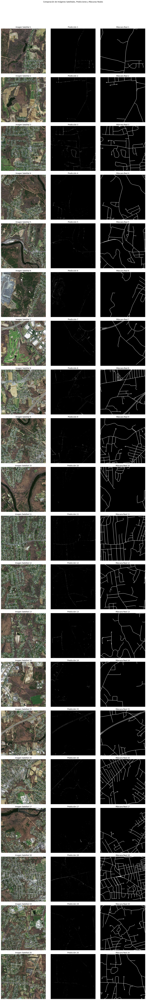

In [13]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os

# Visualizar todas las imágenes de prueba en un gráfico
num_images = len(predicted_images)
fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
fig.suptitle("Comparación de Imágenes Satelitales, Predicciones y Máscaras Reales")

for i, (satellite_image, pred_image, mask_image) in enumerate(predicted_images):
    # Imagen Satelital
    axes[i, 0].imshow(satellite_image)
    axes[i, 0].set_title(f"Imagen Satelital {i+1}")
    axes[i, 0].axis("off")

    # Predicción del modelo
    axes[i, 1].imshow(pred_image, cmap="gray")
    axes[i, 1].set_title(f"Predicción {i+1}")
    axes[i, 1].axis("off")

    # Máscara Real
    axes[i, 2].imshow(mask_image, cmap="gray")
    axes[i, 2].set_title(f"Máscara Real {i+1}")
    axes[i, 2].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [ ]:
import pandas as pd
from sklearn.model_selection import KFold, cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, make_scorer
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Cargar el dataset con los espacios de color
df = pd.read_csv('satellite_road_dataset_color_spaces.csv')

# Definir las combinaciones de características a probar
feature_sets = {
    "RGB": ['R', 'G', 'B'],
    "Lab": ['L', 'a', 'b'],
    "HSV": ['H', 'S', 'V'],
    "RGB+Lab+HSV": ['R', 'G', 'B', 'L', 'a', 'b', 'H', 'S', 'V']
}

# Diccionario para almacenar resultados de cada modelo y conjunto de características
results = {}

# Modelos a entrenar
models = {
    "KNN": KNeighborsClassifier(n_neighbors=5, weights='distance', metric='manhattan'),
    "ANN": MLPClassifier(hidden_layer_sizes=(50,),early_stopping=True, tol=1e-4, max_iter=100, random_state=12),
    "Decision Tree": DecisionTreeClassifier(max_depth=3, min_samples_split=10, min_samples_leaf=5, random_state=12),
    "Random Forest": RandomForestClassifier(n_estimators=30, max_depth=3, max_features='sqrt', min_samples_split=10, min_samples_leaf=5, random_state=12),
}




# Parámetros para K-Folds Cross-Validation
k_folds = 3
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Entrenamiento y evaluación de cada combinación de características y modelo con K-Folds
for feature_set_name, features in feature_sets.items():
    print(f"\nEvaluando características: {feature_set_name}\n{'-'*30}")
    
    # Dividir en características y etiquetas
    X = df[features]
    y = df['Label']
    
    for model_name, model in models.items():
        print(f"\nEvaluando modelo: {model_name} con {feature_set_name} usando {k_folds}-Folds Cross-Validation")
        
        # Lista para almacenar accuracY por cada fold
        fold_accuracies = []
        
        # K-Folds Cross-Validation
        for train_index, test_index in kf.split(X):
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]
            
            # Entrenar el modelo en el fold actual
            model.fit(X_train, Y_train)
            
            # Predicciones en el fold actual
            Y_pred = model.predict(X_test)
            
            # Calcular precisión en el fold actual
            accuracy = accuracy_score(Y_test, Y_pred)
            fold_accuracies.append(accuracy)
        
        # Calcular precisión media y desviación estándar en los k folds
        mean_accuracy = np.mean(fold_accuracies)
        std_accuracy = np.std(fold_accuracies)
        
        # Guardar resultados para la comparación final
        results[(feature_set_name, model_name)] = (mean_accuracy, std_accuracy)
        
        print(f"Precisión promedio de {model_name} con {feature_set_name}: {mean_accuracy * 100:.2f}% (+/- {std_accuracy * 100:.2f}%)")



Evaluando características: RGB
------------------------------

Evaluando modelo: KNN con RGB usando 5-Folds Cross-Validation
Precisión promedio de KNN con RGB: 94.14% (+/- 0.01%)

Evaluando modelo: ANN con RGB usando 5-Folds Cross-Validation
Precisión promedio de ANN con RGB: 95.03% (+/- 0.01%)

Evaluando modelo: Decision Tree con RGB usando 5-Folds Cross-Validation
Precisión promedio de Decision Tree con RGB: 95.02% (+/- 0.01%)

Evaluando modelo: Random Forest con RGB usando 5-Folds Cross-Validation
Precisión promedio de Random Forest con RGB: 95.02% (+/- 0.01%)

Evaluando características: Lab
------------------------------

Evaluando modelo: KNN con Lab usando 5-Folds Cross-Validation
Precisión promedio de KNN con Lab: 94.25% (+/- 0.02%)

Evaluando modelo: ANN con Lab usando 5-Folds Cross-Validation
